# 09 Exercises 1: Intro and Global Temperature Analysis

UW Geospatial Data Analysis  
CEE467/CEWA567  
David Shean  

## Objectives
* Introduce xarray data model for N-d array analysis
* Practice basic N-d array slicing, grouping and aggregation
* Explore global and local climate reanalysis data

In [ ]:
import os
from glob import glob
import numpy as np
import xarray as xr
import pandas as pd
import geopandas as gpd
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import holoviews as hv

## Part 1: Global climatology
### Monthly temperature from 1979-2021
* Two datasets are provided:
    1. Climatology - long-term mean monthly values ofrom 1979-2021 (12 grids)
    2. Anomaly - monthly difference from long-term monthly mean (505 grids from 1979-2021)
* See here for more details: https://cds.climate.copernicus.eu/cdsapp#!/dataset/ecv-for-climate-change?tab=overview

In [ ]:
%pwd

'/home/jovyan/src/gda_course_2023_solutions/modules/09_NDarrays_xarray_ERA5'

## Open the processed global monthly temperature anomaly and climatology NetCDF files
* See relevant doc on opening and writing files: http://xarray.pydata.org/en/stable/io.html
* Note that processing and saving the anomalies could take some time, as you're reading in 480 files and saving a large nc file
* Take a moment to review the steps in the `grib2nc` function of the download notebook, and review the io doc for xarray
    * Note the `open_dataset` and `concat` functions

In [ ]:
era5_datadir = '/home/jovyan/jupyterbook/book/modules/09_NDarrays_xarray_ERA5/era5_data'

In [ ]:
!ls -lh $era5_datadir

total 3.9G
-rw-rw-r-- 1 jovyan users 2.0G Feb 27 00:47 1month_anomaly_Global_ea_2t.nc
-rw-rw-r-- 1 jovyan users  48M Feb 27 00:47 climatology_0.25g_ea_2t.nc
-rw-rw-r-- 1 jovyan users 1.9G Feb 27 00:47 WA_ERA5-Land_hourly_1950-2022_6hr.nc


In [ ]:
t_clim_fn = os.path.join(era5_datadir, 'climatology_0.25g_ea_2t.nc')
t_clim_ds = xr.open_dataset(t_clim_fn)

In [ ]:
t_anom_fn = os.path.join(era5_datadir, '1month_anomaly_Global_ea_2t.nc') 
t_anom_ds = xr.open_dataset(t_anom_fn, chunks='auto')

## Inspect the DataSets
* Discuss with your neighbor
* Review the output when you just type the DataSet name (similar to output from the `info()` method)
* Note the number of time entries in each DataSet
* What are the min and max longitude, min and max latitude
* Note: The timestamp listed in the climatology dataset for each month is arbitrarily listed as 2018 (e.g., '2018-01-01')
    * Remember these are mean values for each month of the year (12 total) across the entire 1979-2021 period
* print info for the 't2m' DataArray (temperature 2 m above ground)

In [ ]:
t_clim_ds

<xarray.Dataset>
Dimensions:    (time: 12, latitude: 721, longitude: 1440)
Coordinates:
  * time       (time) datetime64[ns] 1981-01-01 1981-02-01 ... 1981-12-01
  * latitude   (latitude) float64 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float64 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
Data variables:
    t2m        (time, latitude, longitude) float32 ...
Attributes:
    GRIB_edition:            1
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2022-02-28T07:58 GRIB to CDM+CF via cfgrib-0.9.1...

In [ ]:
t_anom_ds

<xarray.Dataset>
Dimensions:    (time: 517, latitude: 721, longitude: 1440)
Coordinates:
  * time       (time) datetime64[ns] 1979-01-01 1979-02-01 ... 2022-01-01
  * latitude   (latitude) float64 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float64 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
Data variables:
    t2m        (time, latitude, longitude) float32 dask.array<chunksize=(205, 286, 571), meta=np.ndarray>
Attributes:
    GRIB_edition:            1
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2022-02-28T07:59 GRIB to CDM+CF via cfgrib-0.9.1...

## Convert the temperature values from K to C for the climatology dataset
* Note: don't need to do this for anomalies, as they are relative values, not absolute
* These operations are done on the DataArray level (not the top-level DataSet object level), so you'll need to modify `t_clim_ds['t2m']`
    * You can use `-=` syntax here
    * Or, update the `t_clim_ds['t2m'].values`
* Make sure you also update the units metadata attribute
    * The units used by xarray are stored in the t_clim_ds['t2m'].attrs dictionary
    * There is also a GRIB units variable, but this is holdover from the grib to xarray conversion
* Sanity check values

In [ ]:
#Student Exercise

In [ ]:
#Student Exercise

{'GRIB_paramId': 167,
 'GRIB_dataType': 'an',
 'GRIB_numberOfPoints': 1038240,
 'GRIB_typeOfLevel': 'surface',
 'GRIB_stepUnits': 1,
 'GRIB_stepType': 'avgua',
 'GRIB_gridType': 'regular_ll',
 'GRIB_NV': 0,
 'GRIB_Nx': 1440,
 'GRIB_Ny': 721,
 'GRIB_cfName': 'unknown',
 'GRIB_cfVarName': 't2m',
 'GRIB_gridDefinitionDescription': 'Latitude/Longitude Grid',
 'GRIB_iDirectionIncrementInDegrees': 0.25,
 'GRIB_iScansNegatively': 0,
 'GRIB_jDirectionIncrementInDegrees': 0.25,
 'GRIB_jPointsAreConsecutive': 0,
 'GRIB_jScansPositively': 0,
 'GRIB_latitudeOfFirstGridPointInDegrees': 90.0,
 'GRIB_latitudeOfLastGridPointInDegrees': -90.0,
 'GRIB_longitudeOfFirstGridPointInDegrees': 0.0,
 'GRIB_longitudeOfLastGridPointInDegrees': 359.75,
 'GRIB_missingValue': 9999,
 'GRIB_name': '2 metre temperature',
 'GRIB_shortName': '2t',
 'GRIB_totalNumber': 0,
 'GRIB_units': 'C',
 'long_name': '2 metre temperature',
 'units': 'C',
 'standard_name': 'unknown',
 'coordinates': 'number time step surface latitude

## Set the longitude values to be (-180 to 180) instead of (0 to 360)
* Could also store as new set of coordinates called `longitude_180` or something

In [ ]:
def ds_swaplon(ds):
    return ds.assign_coords(longitude=(((ds.longitude + 180) % 360) - 180)).sortby('longitude')

In [ ]:
t_clim_ds = ds_swaplon(t_clim_ds)

In [ ]:
t_anom_ds = ds_swaplon(t_anom_ds)

In [ ]:
t_clim_ds.longitude

<xarray.DataArray 'longitude' (longitude: 1440)>
array([-180.  , -179.75, -179.5 , ...,  179.25,  179.5 ,  179.75])
Coordinates:
  * longitude  (longitude) float64 -180.0 -179.8 -179.5 ... 179.2 179.5 179.8

## Isolate the data for the month of August and plot
* Review different strategies for selection here: http://xarray.pydata.org/en/stable/indexing.html
* Try the `isel` method with dimension name and integer index (e.g., `time=7`)
* Try the `sel` method with dimension name and label (e.g., `time='2016-08-01'`, though the year may be different in your dataset)
* Note: the xarray convenience `plot.imshow()` is much more efficient for regular grids than the default `plot()`, which uses `contourf` to interpolate values not on a regular grid
    * See the note here: https://xarray-test.readthedocs.io/en/latest/plotting.html#two-dimensions
* Try the `robust=True` option

In [ ]:
#See time dimension index
t_clim_ds.time

<xarray.DataArray 'time' (time: 12)>
array(['1981-01-01T00:00:00.000000000', '1981-02-01T00:00:00.000000000',
       '1981-03-01T00:00:00.000000000', '1981-04-01T00:00:00.000000000',
       '1981-05-01T00:00:00.000000000', '1981-06-01T00:00:00.000000000',
       '1981-07-01T00:00:00.000000000', '1981-08-01T00:00:00.000000000',
       '1981-09-01T00:00:00.000000000', '1981-10-01T00:00:00.000000000',
       '1981-11-01T00:00:00.000000000', '1981-12-01T00:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 1981-01-01 1981-02-01 ... 1981-12-01
Attributes:
    long_name:      initial time of forecast
    standard_name:  forecast_reference_time

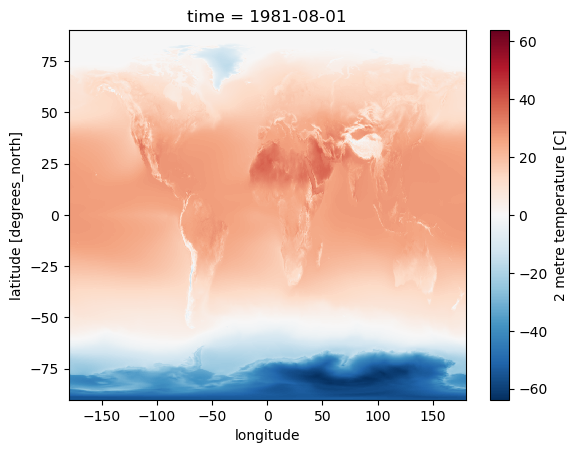

In [ ]:
#Student Exercise

## Create a plot for August, overlaying coastlines with cartopy
Use a simple PlateCaree() projection as in example here:
* https://scitools.org.uk/cartopy/docs/v0.15/matplotlib/intro.html

Once you have your axes setup, you should be able to plot with xarray easily (pass the axes object to `plot()` function:
* http://xarray.pydata.org/en/stable/plotting.html#maps  
Don't use a discrete color ramp as in some of the examples, use a continuous linear color ramp, as in the facet plot.

Note how 2-m temperature varies with elevation (e.g., see the Tibetan Plateau)

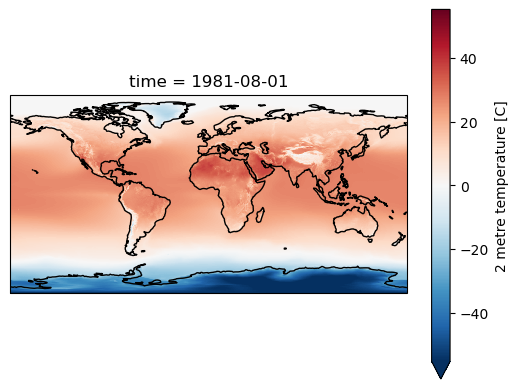

In [ ]:
f = plt.figure()
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ts = '1981-08-01'
t_clim_ds['t2m'].sel(time=ts).plot.imshow(ax=ax, robust=True);

## Create a Facet plot showing temperature grids for each month in the climatology DataSet
* http://xarray.pydata.org/en/stable/plotting.html#faceting
* Note that these plots can be memory hungry, and if you have other kernels running, this could fill RAM and cause kernel to stop
    * Could try isolating a smaller area to test (see slicing) then running on full dataset when satisfied
* Make sure your units are correct in the colorbar
* Note that xarray uses a different definition of `aspect` than matplotlib
    * https://docs.xarray.dev/en/stable/user-guide/plotting.html#controlling-the-figure-size
    * Since we have 360° of longitude and 180° of latitude, an aspect of 2 should work well here
* While they may look similar, each panel is slightly different
    * Take a moment to admire this, look at seasonal cycles

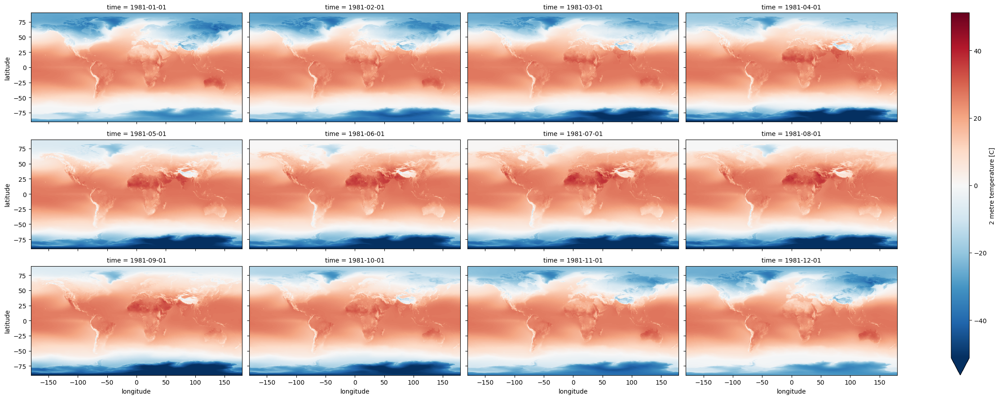

In [ ]:
#Student Exercise

## Use Holoviz for interactive plotting
* Multiple plotting backends can be used with xarray
    * We previously used Seaborn, and folium/ipyleaflet for interactive maps
* Still under development, but `hvplot` is flexible and powerful:
    * https://holoviz.org/

In [ ]:
import hvplot.xarray 

#### Create interactive plot with hvplot()
* Note how coordinates and values are interactively displayed as you move your cursor over the plot
* Experiment with time slider on right side
* Experiment with zoom/pan capability

In [ ]:
#t_clim_ds['t2m'].hvplot(x='longitude',y='latitude', cmap='RdBu_r', clim=(-50,50))

## Reprojecting with rioxarray
* Those visualizations are nice, but we have a problem for further analysis...
    * The netcdf files have equally spaced grid points every 0.25° of latitude and longitude, which means we are oversampling in the polar regions
        * Think back to Lab04 about the true distance covered by 0.25° degree of longitude near the pole (close to 0 m) vs 0.25° of longitude near the equator (~28 km)
        * The default Plate Carrée "projection" (cylindrical equidistant) for lat/lon data is fine for quick visualization, but it distorts area, especially in the polar regions
    * If we compute mean or other statistics without accounting for this, our results will be biased, incorrectly weigthing the polar regions
* Fortunately, we can use `rioxarray` to quickly reproject into an equal-area projection for these calculations
    * First need to assigning a crs to the xarray dataset
    * Can then use `xds.rio.reproject()`
    * https://corteva.github.io/rioxarray/stable/examples/reproject.html
* Caveat: The better way to do this would be to use the original Gaussian grid from the model, but since we have the netCDF data on regular grid, let's just work with those

In [ ]:
import rioxarray

In [ ]:
#Set CRS of the original xarray Datasets
t_clim_ds.rio.write_crs('EPSG:4326', inplace=True);
t_anom_ds.rio.write_crs('EPSG:4326', inplace=True);

In [ ]:
#print(t_clim_ds.spatial_ref)

In [ ]:
#Cylindrical equal area
ea_proj = '+proj=cea +lat_ts=45'
#Equal Earth (not working correctly)
ea_proj = '+proj=eqearth'
#Mollweide
ea_proj = '+proj=moll'
#ea_proj = 'EPSG:6933'

In [ ]:
#Reproject and store output
t_clim_ds_proj = t_clim_ds['t2m'].rio.reproject(ea_proj, resampling=3)

In [ ]:
#Reverse projection
#Note: output only spans -81 to 81°, not original -90° to 90°, need to revisit
#t_clim_ds_proj.rio.reproject('EPSG:4326')['y'].min()
#t_clim_ds_proj.rio.reproject('EPSG:4326', resampling=3).isel(time=0).plot.imshow()

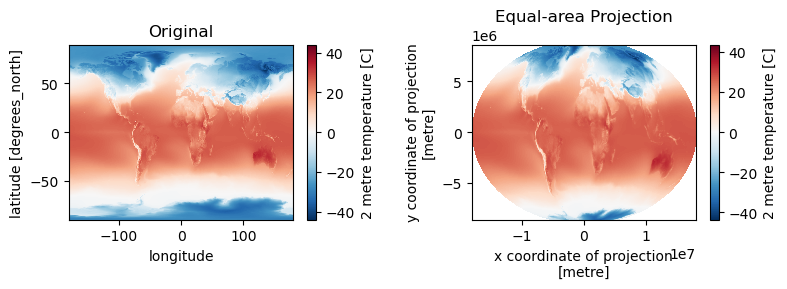

In [ ]:
f, axa = plt.subplots(1,2, figsize=(8,3))
t_clim_ds['t2m'].isel(time=0).plot.imshow(ax=axa[0])
axa[0].set_title('Original')
t_clim_ds_proj.isel(time=0).plot.imshow(ax=axa[1])
axa[1].set_title('Equal-area Projection')
plt.tight_layout()

### Compare mean values for the two projections

In [ ]:
print("Original global mean T:", t_clim_ds['t2m'].mean().values)
print("Equal-area projection global mean T:", t_clim_ds_proj.mean().values)

Original global mean T: 5.2075896
Equal-area projection global mean T: 14.664276


* Much closer to expected value of 13.9° for 20th Century (https://www.ncei.noaa.gov/access/monitoring/monthly-report/global/)
* Remember that our dataset is for 1979-2022 period, so we actually expect it to be slightly warmer than the average for the 1900-2000 period

### Visualization using Robinson Projection
* This is a good compromise for global plots
* But it is not equal area
    * Equal Earth is a better option: https://proj.org/operations/projections/eqearth.html
    * Unfortunately, there is a bug in rioxarray/PROJ and this is not working correctly for this dataset

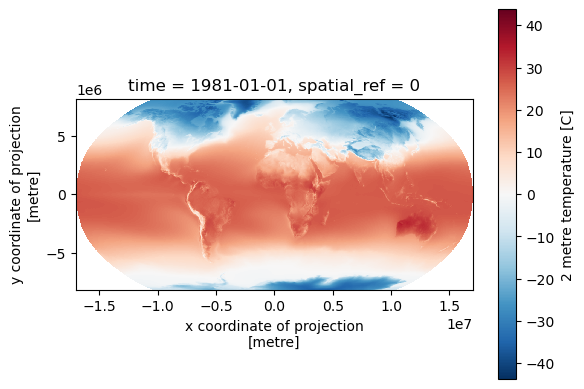

In [ ]:
f, ax = plt.subplots()
t_clim_ds['t2m'].isel(time=0).rio.reproject('+proj=robin', resampling=3).plot.imshow(ax=ax)
ax.set_aspect('equal')

## Define variables for remainder of lab

In [ ]:
#Using original EPSG:4326 lat/lon
#t_clim_da = t_clim_ds['t2m']
#xdim = 'longitude'
#ydim = 'latitude'

In [ ]:
#Using cylindrical equal area projection for analysis
t_clim_da = t_clim_ds_proj
xdim = 'x'
ydim = 'y'

## Create line plot of global monthly temperature
* Compute the mean of the reprojected climatology t2m DataArray across the spatial dimensions (both x and y)
* Remember to pass the appropriate `dim=(...)` to `mean()` so xarray knows over which dimensions to compute the mean!)

In [ ]:
#Not this! Gives a single value for full array
#t_clim_da.mean()

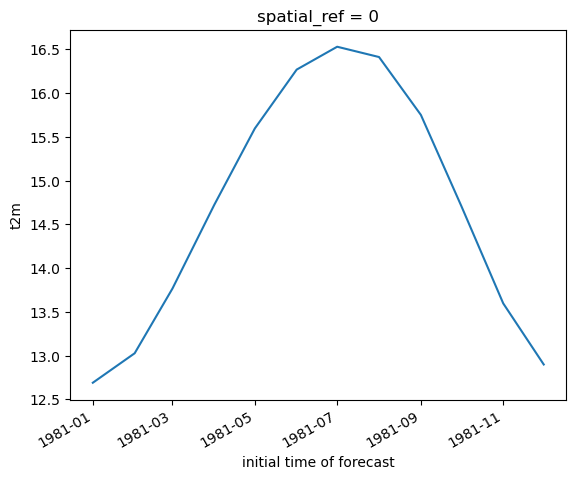

In [ ]:
#Student Exercise

## Create 2D plot showing mean temperature vs. latitude (averaged over all longitudes)

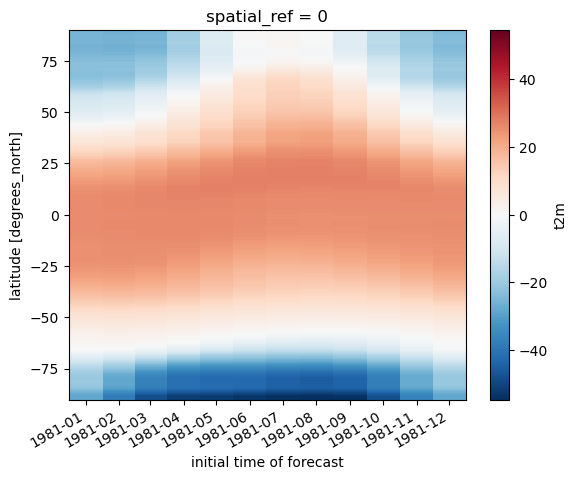

In [ ]:
#Student Exercise

## Create line plots of mean zonal and meridional temperature
* https://en.wikipedia.org/wiki/Zonal_and_meridional
* Hint: specify a tuple of appropriate dimensions for the `dim` keyword when computing `mean()`
    * Above we used `dim=('latitude', 'longitude')` to average all latitudes and longitudes, plotting the resulting values over time
    * Now in the zonal mean case, we want to average for all latitudes and times, plotting resulting values vs. longitude
* Create as figure with two subplots: meridional mean T and zonal mean T
* Add titles accordingly

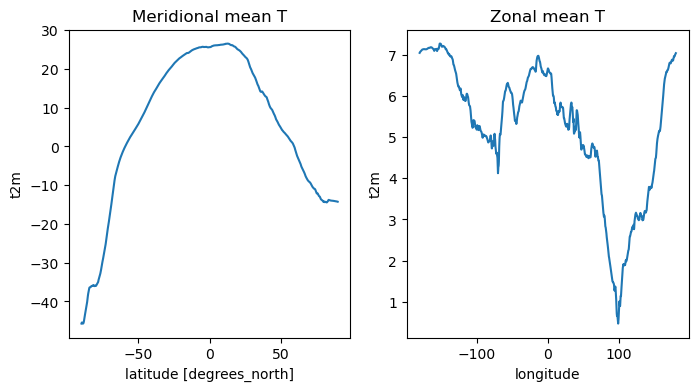

In [ ]:
#Student Exercise

## Create a plot showing monthly mean temperature for the Arctic and Antarctic
* See location indexing here: http://xarray.pydata.org/en/stable/indexing.html#assigning-values-with-indexing
* One approach:
    * Create boolean index arrays for `t_clim_ds['latitude']` coordinate for relevant latitude ranges
        * Use Arctic circle and Antarctic circle as a threshold
            * https://en.wikipedia.org/wiki/Arctic_Circle
    * Use the index array with xarray `where` method on the `t_clim_ds['t2m']` DataArray
        * Make sure to use `drop=True` to avoid unnecessarily storing lots of nan values in memory
    * Compute the mean across all returned lat/lon grid cells
* Note the magnitude and phase of the seasonal temperature varability at the opposite poles

In [ ]:
polar_lat = 66.5 #degrees

### Convert polar circle latitude to y-coordinate for equal area projection

In [ ]:
#Compute y coordinate of polar circle latitude
from pyproj import CRS, Transformer
transformer = Transformer.from_crs(CRS.from_epsg(4326), CRS.from_proj4(ea_proj))
polar_y = transformer.transform(polar_lat, 0)[-1]
polar_y

7474236.788842151

In [ ]:
if ydim == 'latitude':
    polar_y = polar_lat

In [ ]:
polar_y

7474236.788842151

In [ ]:
arctic_idx = (t_clim_da[ydim] >= polar_y)
antarctic_idx = (t_clim_da[ydim] <= -polar_y)
nonpolar_idx = (t_clim_da[ydim] < polar_y) & (t_clim_da[ydim] > -polar_y)

In [ ]:
#Sanity check
#arctic_idx[::10]
#antarctic_idx[::10]
#nonpolar_idx[::10]

In [ ]:
kwargs = dict(cmap='RdBu_r', vmin=-50, vmax=50)

In [ ]:
#Student Exercise

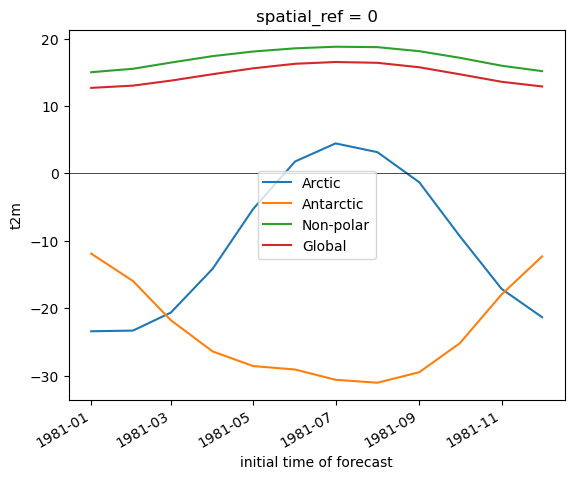

In [ ]:
#Student Exercise

## Extra Credit: Repeat the above analysis, isolating land and ocean classes
* Hint: can use `rioxarray` for clipping using a GeoDataFrame or geometry

### Open the world polygons

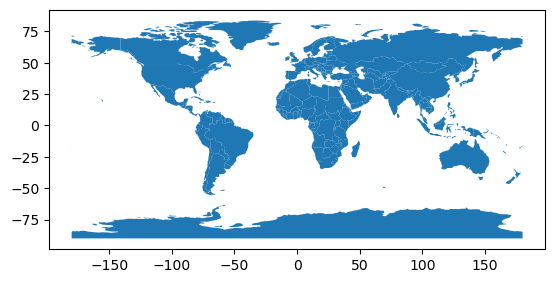

In [ ]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
#Hack to set to latest PROJ syntax, instead of 'init'
world.crs = 'EPSG:4326'
world.plot();

In [ ]:
#world.to_crs(ea_proj).plot();

### Use `rioxarray` `clip` function
* Code and documentation is still under development, but you can read more here:
    * https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
    * https://corteva.github.io/rioxarray/stable/examples/clip_geom.html

In [ ]:
#Mask values over ocean
t_clim_ds_land = t_clim_da.rio.clip(world.to_crs(t_clim_da.rio.crs).geometry, crs=t_clim_da.rio.crs, drop=False)
#Invert to mask values over land
t_clim_ds_ocean = t_clim_da.rio.clip(world.to_crs(t_clim_da.rio.crs).geometry, crs=t_clim_da.rio.crs, drop=False, invert=True)

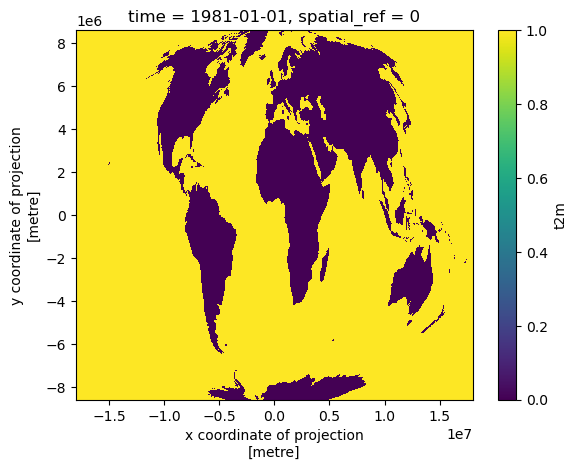

In [ ]:
#Preview land mask
t_clim_ds_land.isel(time=0).isnull().plot.imshow();

#### Create maps for land and ocean T

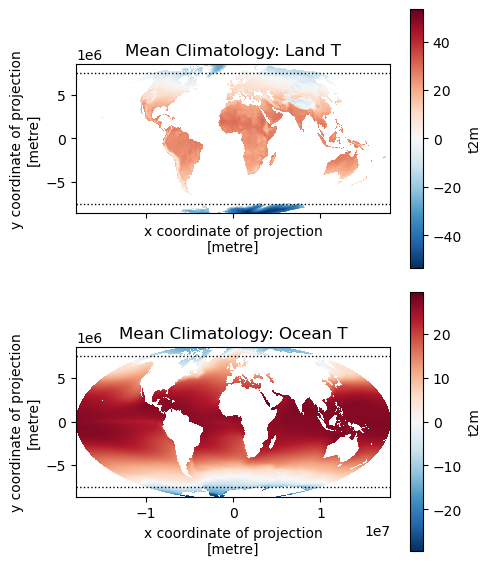

In [ ]:
f, axa = plt.subplots(2,1, sharex=True, sharey=True, figsize=(5,6))
t_clim_ds_land.mean(dim='time').plot(ax=axa[0], cmap='RdBu_r', clim=(-50,50))
t_clim_ds_ocean.mean(dim='time').plot(ax=axa[1], cmap='RdBu_r', clim=(-50,50))
axa[0].set_title('Mean Climatology: Land T')
axa[1].set_title('Mean Climatology: Ocean T')
kwargs = dict(color='k', lw=1.0, ls=':')
for ax in axa:
    ax.axhline(polar_y, **kwargs)
    ax.axhline(-polar_y, **kwargs)
    ax.set_aspect('equal')
plt.tight_layout()

#### Create line plots for land and ocean T

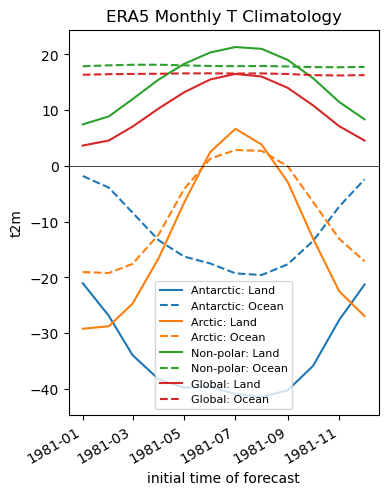

In [ ]:
f, ax = plt.subplots(figsize=(4,5))
t_clim_ds_land.where(antarctic_idx, drop=True).mean(dim=(xdim, ydim)).plot(ax=ax, color='C0', ls='-', label='Antarctic: Land')
t_clim_ds_ocean.where(antarctic_idx, drop=True).mean(dim=(xdim, ydim)).plot(ax=ax, color='C0', ls='--', label='Antarctic: Ocean')
t_clim_ds_land.where(arctic_idx, drop=True).mean(dim=(xdim, ydim)).plot(ax=ax, color='C1', ls='-', label='Arctic: Land')
t_clim_ds_ocean.where(arctic_idx, drop=True).mean(dim=(xdim, ydim)).plot(ax=ax, color='C1', ls='--', label='Arctic: Ocean')
t_clim_ds_land.where(nonpolar_idx, drop=True).mean(dim=(xdim, ydim)).plot(ax=ax, color='C2', ls='-', label='Non-polar: Land')
t_clim_ds_ocean.where(nonpolar_idx, drop=True).mean(dim=(xdim, ydim)).plot(ax=ax, color='C2', ls='--', label='Non-polar: Ocean')
t_clim_ds_land.mean(dim=('x', 'y')).plot(ax=ax, color='C3', ls='-', label='Global: Land')
t_clim_ds_ocean.mean(dim=('x', 'y')).plot(ax=ax, color='C3', ls='--', label='Global: Ocean')
ax.axhline(0, color='k', lw=0.5)
ax.set_title('ERA5 Monthly T Climatology')
ax.legend(fontsize=8);

## Temporal Variability: Anomalies

I heard somewhere that climate change was a hoax.  Let's check.

To do this, we will use the monthly anomalies from 1979-present, contained in the `t_anom_ds` DataSet

In [ ]:
#Reproject anomaly dataset to equal area projection
#This temporarily requires ~6 GB RAM
t_anom_ds_proj = t_anom_ds['t2m'].rio.reproject(ea_proj)

In [ ]:
#Define the anomaly data array to use for subsequent analysis
#t_anom_da = t_anom_ds['t2m']
t_anom_da = t_anom_ds_proj

### Create a line plot of mean global monthly temperature anomaly from 1979-present
* This should be a simple one-liner
* Note: if you used xarray's default lazy load of the `nc` file, and this is the first time reading the entire `t_anom_ds` from disk, this may take ~20 seconds

In [ ]:
#Compute the mean anomaly time series
#Doing this in separate cell, as computing on the fly while plotting consumes a lot of memory
t_anom_da_global = t_anom_da.mean(dim=(xdim, ydim)).compute()

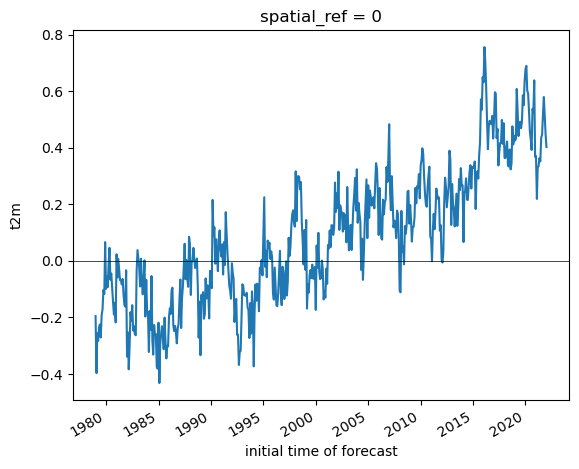

In [ ]:
#Student Exercise

In [ ]:
#Student Exercise

### Did the Arctic and Antarctic warm at the same rate over the past 40 years?
* Create a line plot showing anomalies for each region, you can reuse indices from above

In [ ]:
t_anom_da_antarctic = t_anom_da.where(antarctic_idx, drop=True).mean(dim=(xdim, ydim)).compute()

In [ ]:
t_anom_da_arctic = t_anom_da.where(arctic_idx, drop=True).mean(dim=(xdim, ydim)).compute()

In [ ]:
#t_anom_da_nonpolar = t_anom_da.where(nonpolar_idx, drop=True).mean(dim=(xdim, ydim))

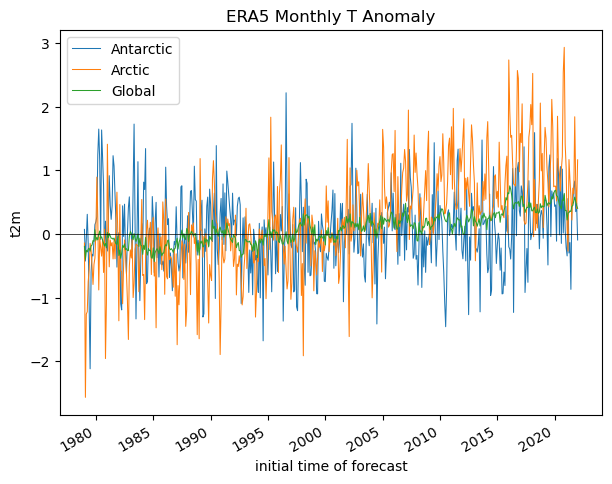

In [ ]:
f, ax = plt.subplots(figsize=(7,5))
kwargs = {'lw':0.75,'ls':'-'}
t_anom_da_antarctic.plot(ax=ax, label='Antarctic', **kwargs)
t_anom_da_arctic.plot(ax=ax, label='Arctic', **kwargs)
#t_anom_da_nonpolar.plot(ax=ax, label='Non-polar', **kwargs)
t_anom_da_global.plot(ax=ax, label='Global', **kwargs)
ax.axhline(0, color='k', lw=0.5)
ax.set_title('ERA5 Monthly T Anomaly')
ax.legend();
#ax.set_xlim('2015-01-01','2019-01-01')

## Extra credit: compute linear temperature trend at each pixel and create a map with coastlines
* Note: can coarsen the data to 1x1° to improve performance (16x!)
* See the xarray `polyfit` function: https://docs.xarray.dev/en/stable/generated/xarray.DataArray.polyfit.html
    * A linear fit is degree 1
    * This will return two coefficients (m and b in y=mx+b), so we want to consider m here

In [ ]:
t_anom_ds.dims

Frozen({'time': 517, 'latitude': 721, 'longitude': 1440})

In [ ]:
ds_factor=4
t_anom_ds_1deg = t_anom_ds.coarsen(latitude=ds_factor, longitude=ds_factor, boundary='trim').mean()

In [ ]:
t_anom_ds_1deg.dims

Frozen({'time': 517, 'latitude': 180, 'longitude': 360})

In [ ]:
#The difference along the time axis will return values in degrees C per timedelta64[ns] - nanoseconds
#We want degrees C per year
#Conversion factor from nanoseconds to year
dt_factor = 1E9 * (60*60*24*365.25)

In [ ]:
#Student Exercise

In [ ]:
#Student Exercise

In [ ]:
years = pd.DatetimeIndex(t_anom_ds_1deg.time.values).year

Text(0.5, 1.0, 'Rate of T change: 1979-2022')

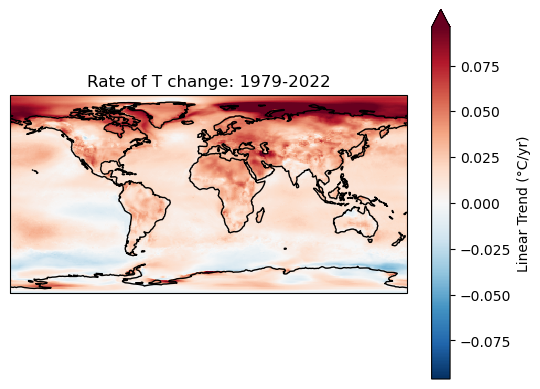

In [ ]:
#Student Exercise

## Extra credit: Group temperature anomalies by decade
* See pandas/xarray `resample` function
* Relevant aliases: https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#dateoffset-objects
* How does the most recent decade compare with the first decade in the time series?
    * Note that first or last decade in the record might not be "complete" with 10 full years

In [ ]:
#Student Exercise

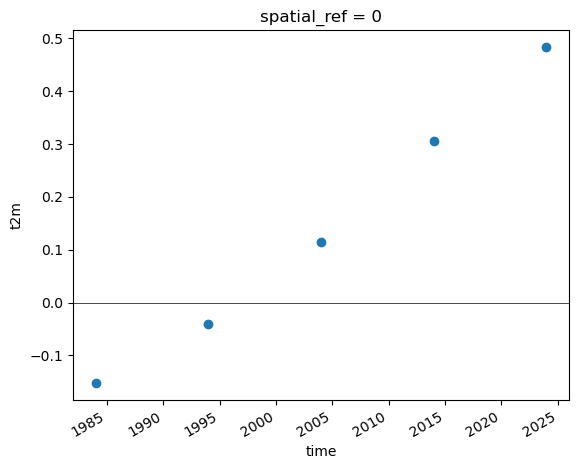

In [ ]:
#Student Exercise

## Clip to WA state

### Get the WA state outline

In [ ]:
#states_url = 'http://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_040_00_5m.json'
states_url = 'http://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_040_00_500k.json'
states_gdf = gpd.read_file(states_url)

In [ ]:
wa_state = states_gdf.loc[states_gdf['NAME'] == 'Washington']

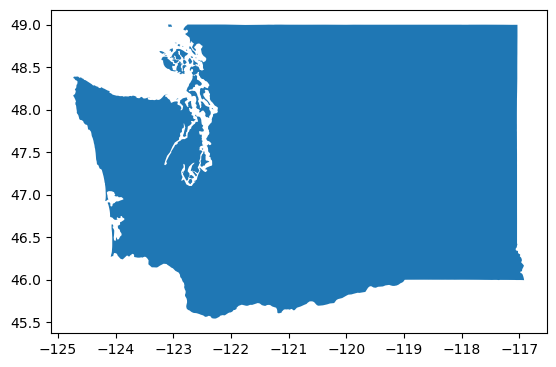

In [ ]:
wa_state.plot();

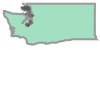

In [ ]:
wa_geom = wa_state.iloc[0].geometry
wa_geom

### Get rounded bounds on same grid as ERA5

In [ ]:
wa_bounds = wa_state.total_bounds
wa_bounds

array([-124.733174,   45.543541, -116.915989,   49.002494])

In [ ]:
def myround(x, base=0.25):
    return base * np.round(x/base)

def roundbounds(bounds, base=0.25):
    bounds_floor = np.floor(bounds/base)*base
    bounds_ceil = np.ceil(bounds/base)*base
    return [bounds_floor[0], bounds_floor[1], bounds_ceil[2], bounds_ceil[3]]

In [ ]:
wa_rbounds = roundbounds(wa_bounds)
wa_rbounds

[-124.75, 45.5, -116.75, 49.25]

### Clip with bounding box selection

In [ ]:
t_clim_ds_wa = t_clim_ds.sel(latitude=slice(wa_rbounds[3],wa_rbounds[1]), longitude=slice(wa_rbounds[0],wa_rbounds[2]))

In [ ]:
t_anom_ds_wa = t_anom_ds.sel(latitude=slice(wa_rbounds[3],wa_rbounds[1]), longitude=slice(wa_rbounds[0],wa_rbounds[2]))

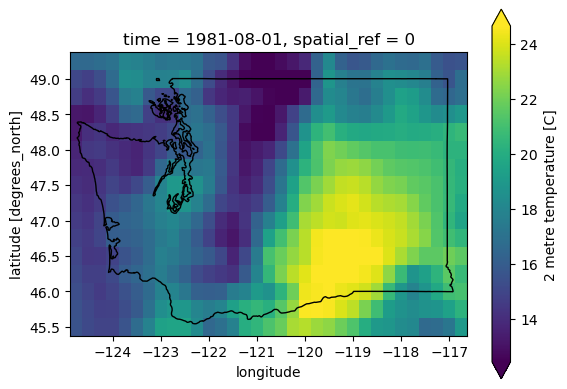

In [ ]:
f, ax = plt.subplots()
t_clim_ds_wa['t2m'].sel(time=ts).plot(ax=ax, robust=True);
wa_state.plot(ax=ax, edgecolor='k', facecolor='none');

## Extra credit: Compute linear temperature trend for WA state
* How does this compare with the global temperature trends?

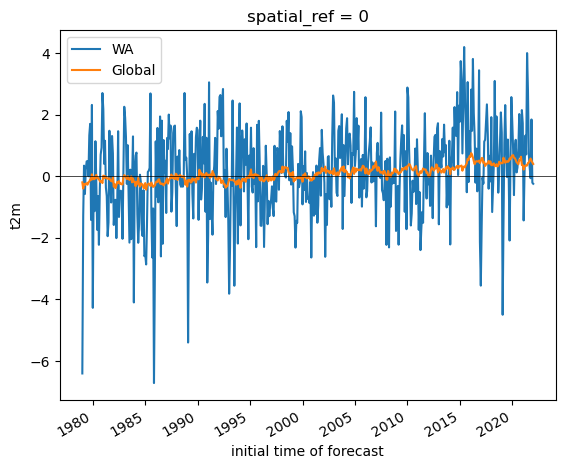

In [ ]:
#Student Exercise

In [ ]:
fit = t_anom_ds_wa['t2m'].polyfit(dim='time', deg=1)['polyfit_coefficients']
fit['degree'==1] *= dt_factor
fit.name = 'Linear Trend (°C/yr)'

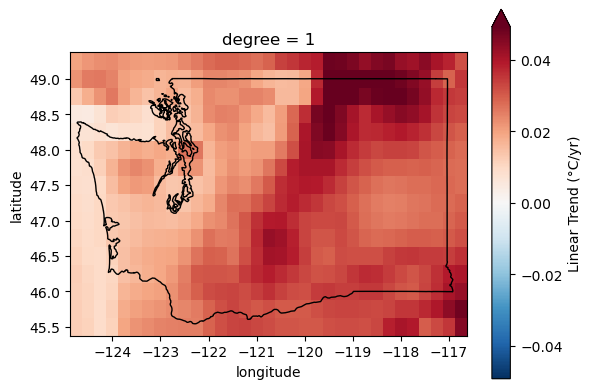

In [ ]:
f, ax = plt.subplots()
fit.sel(degree=1).plot(ax=ax, robust=True, cmap='RdBu_r', center=0);
wa_state.plot(ax=ax, edgecolor='k', facecolor='none');